In [1]:
print('Start import')
import socket 
import strax
import straxen
import numpy as np
import datetime
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import datetime
import pandas as pd
print(
f'''Working on {socket.getfqdn()} with the following versions 
and installation paths:
strax
\tv{strax.__version__}\t{str(strax.__path__[0])}
straxen
\tv{straxen.__version__}\t{str(straxen.__path__[0])}
''')
from multihist import Hist1d, Histdd
import time
import itertools
import os

from scipy import stats
from straxen import units
from scipy.optimize import curve_fit

import peaks_utility as psu
import drift_diffusion_utility as ddu
import s2widthcut_utility as wcu
import math
from datetime import datetime, timedelta

Start import


/dali/lgrandi/strax/straxen/straxen/rucio.py:29: UserWarning: No installation of rucio-clients found. Can't use rucio remote backend.
  warnings.warn("No installation of rucio-clients found. Can't use rucio remote backend.")


Working on midway2-0416.rcc.local with the following versions 
and installation paths:
strax
	v0.16.1	/dali/lgrandi/strax/strax/strax
straxen
	v0.19.3	/dali/lgrandi/strax/straxen/straxen



In [2]:
st = straxen.contexts.xenonnt_online()

In [11]:
dsets = st.select_runs(exclude_tags=('bad','messy','abandon','flash','ramp_up',
                                     'ramp down','hev test','_messy'),
                       run_mode='tpc_radon',
                       available=('peak_basics'))

In [4]:
dsets = dsets[(dsets.end > pd.to_datetime('06/03/2021'))]

In [12]:
dsets

,name,number,mode,end,start,tags,livetime,peak_basics_available,raw_records_available,events_available
1625,024316,24316,tpc_radon,2021-06-29 12:33:02.873,2021-06-29 11:34:08.261,,0 days 00:58:54.612000,True,False,True
1629,024312,24312,tpc_radon,2021-06-29 11:33:36.666,2021-06-29 10:33:36.080,,0 days 01:00:00.586000,True,False,True
1633,024308,24308,tpc_radon,2021-06-29 10:33:04.242,2021-06-29 09:33:03.114,,0 days 01:00:01.128000,True,False,True
1637,024304,24304,tpc_radon,2021-06-29 09:32:35.349,2021-06-29 08:32:34.251,,0 days 01:00:01.098000,True,False,True
1640,024301,24301,tpc_radon,2021-06-29 08:31:47.445,2021-06-29 07:31:47.009,,0 days 01:00:00.436000,True,False,True
...,...,...,...,...,...,...,...,...,...,...
1915,024026,24026,tpc_radon,2021-06-26 05:37:08.038,2021-06-26 05:28:29.792,_sr0_preliminary,0 days 00:08:38.246000,True,False,True
1918,024023,24023,tpc_radon,2021-06-26 05:27:38.682,2021-06-26 04:27:35.856,_sr0_preliminary,0 days 01:00:02.826000,True,False,True
1950,023991,23991,tpc_radon,2021-06-25 19:00:03.341,2021-06-25 18:49:22.447,_sr0_preliminary,0 days 00:10:40.894000,True,False,True
1953,023988,23988,tpc_radon,2021-06-25 18:43:13.873,2021-06-25 17:43:10.012,_sr0_preliminary,0 days 01:00:03.861000,True,False,True


In [14]:
import pickle
path = '/home/kazama/dali/xenonnt/analysis/leakage/Rn220.pkl' 
f = open(path,'rb')
data = pickle.load(f)

AttributeError: Can't get attribute 'new_block' on <module 'pandas.core.internals.blocks' from '/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/pandas/core/internals/blocks.py'>

In [5]:
Rn220_runs = np.array(dsets['name'])

In [6]:
Rn220_runs

array(['024316', '024312', '024308', '024304', '024301', '024298',
       '024295', '024292', '024289', '024286', '024283', '024280',
       '024277', '024274', '024271', '024268', '024265', '024262',
       '024259', '024250', '024245', '024238', '024231', '024221',
       '024220', '024219', '024218', '024217', '024216', '024215',
       '024213', '024210', '024207', '024204', '024201', '024198',
       '024195', '024192', '024189', '024186', '024183', '024180',
       '024177', '024174', '024171', '024168', '024165', '024162',
       '024159', '024142', '024139', '024136', '024134', '024133',
       '024126', '024123', '024120', '024116', '024113', '024109',
       '024075', '024072', '024031', '024028', '024026', '024023',
       '023991', '023988', '023985'], dtype=object)

In [7]:
runs, all_rates, mask_rates, times = [], [], [], []
for run in Rn220_runs:
    events = st.get_df(run,'event_info',progress_bar=False)
    mask, all_rate, mask_rate, start_time = ddu.mask_s2_area_width_aft(events,run,area_cut=(1e4,5e6),width_cut=(200,1.5e4),aft_cut=(0.65,0.77),high=7)
    all_rates = np.append(all_rates,all_rate)
    mask_rates = np.append(mask_rates,mask_rate)
    times = np.append(times,start_time)
    runs = np.append(runs,run)

run 024316, start 2021-06-29 06:34:08.301682, livetime 3534.27 s, rate: 7.48 Hz, selection rate: 0.00 Hz
run 024312, start 2021-06-29 05:33:36.108110, livetime 3599.68 s, rate: 7.48 Hz, selection rate: 0.00 Hz
run 024308, start 2021-06-29 04:33:03.073932, livetime 3600.55 s, rate: 7.67 Hz, selection rate: 0.00 Hz
run 024304, start 2021-06-29 03:32:34.278040, livetime 3600.71 s, rate: 7.72 Hz, selection rate: 0.00 Hz
run 024301, start 2021-06-29 02:31:47.188175, livetime 3600.03 s, rate: 7.83 Hz, selection rate: 0.00 Hz
run 024298, start 2021-06-29 01:31:13.002476, livetime 3602.53 s, rate: 7.89 Hz, selection rate: 0.00 Hz
run 024295, start 2021-06-29 00:30:40.492430, livetime 3596.46 s, rate: 8.02 Hz, selection rate: 0.01 Hz
run 024292, start 2021-06-28 23:30:15.084432, livetime 3601.10 s, rate: 8.13 Hz, selection rate: 0.01 Hz
run 024289, start 2021-06-28 22:29:24.010087, livetime 3603.77 s, rate: 8.33 Hz, selection rate: 0.01 Hz
run 024286, start 2021-06-28 21:28:54.167951, livetime 

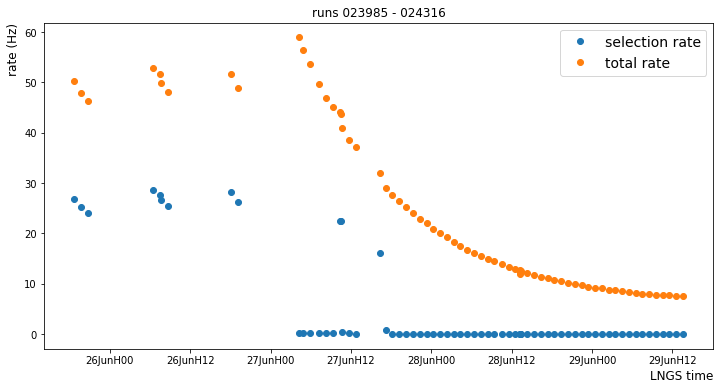

In [8]:
wcu.plot_rate_vs_time(runs,mask_rates,all_rates,times)

run 023098, start 2021-06-16 00:56:09.224984, livetime 1800.44 s, rate: 13.08 Hz, selection rate: 8.01 Hz
Drift velocity = 0.666~mm/$\mu$s
Diffusion constant = 49.46 +/- inf cm$^2$/s 


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


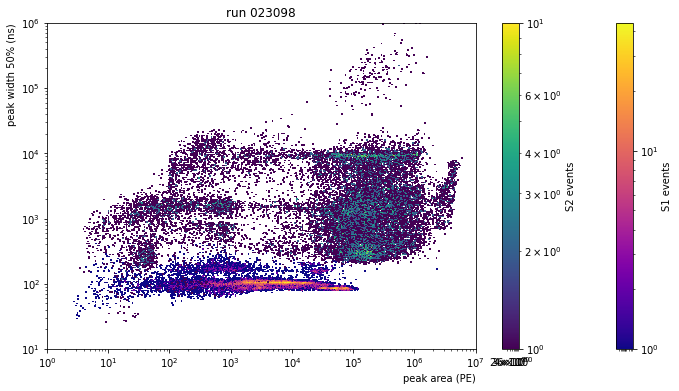

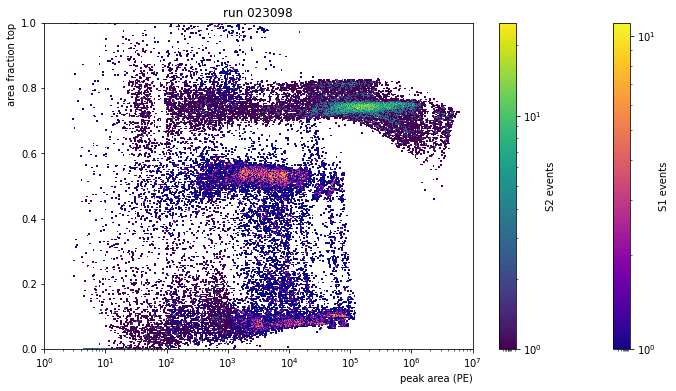

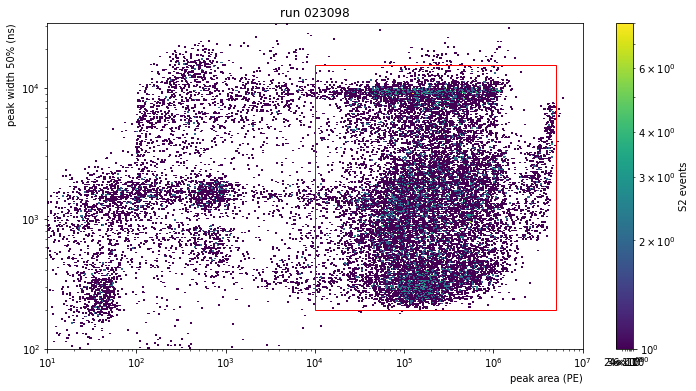

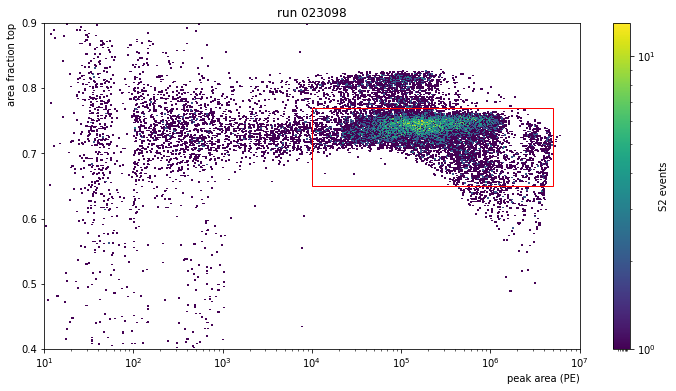

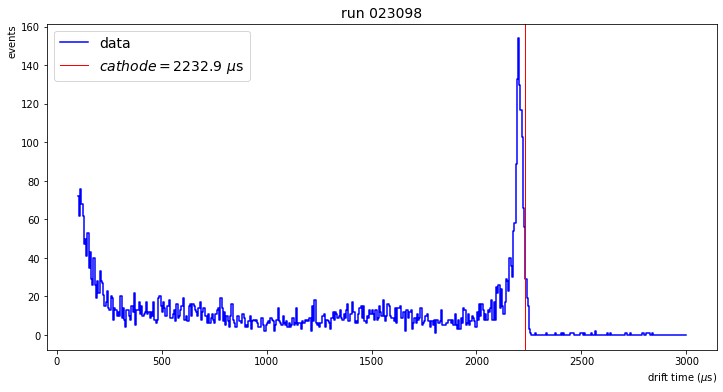

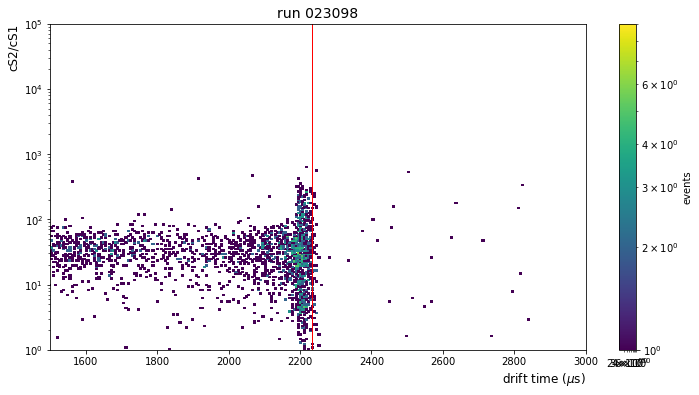

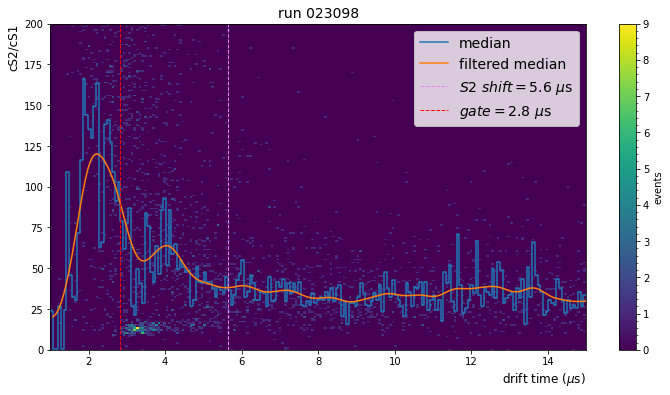

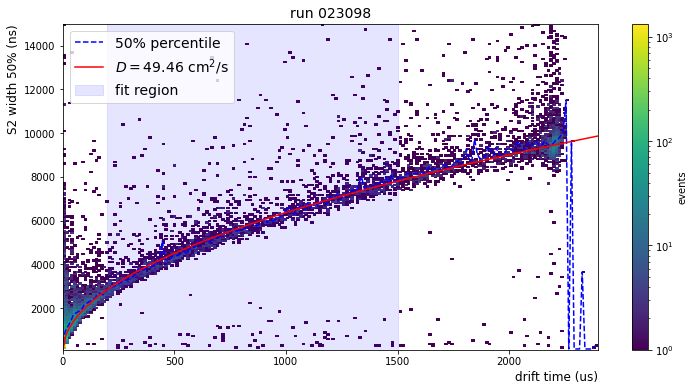

In [10]:
run, vd, vd_err, d, d_err, par, par_err = ddu.diffusion_analysis(st,Rn220_runs[4],area_cut=(1e4,5e6),fit_range=(1,1500), plot = True)

In [11]:
Rn220_events = wcu.merge_runs(st,Rn220_runs)

Reading runs from 021918 to 023343
n. 4 run 023096 elapsed time: 1.87 s
n. 9 run 023082 elapsed time: 4.29 s
n. 14 run 023067 elapsed time: 7.18 s
n. 19 run 023052 elapsed time: 10.90 s
n. 24 run 023015 elapsed time: 15.71 s
n. 29 run 022892 elapsed time: 22.18 s
n. 34 run 022877 elapsed time: 30.30 s
n. 39 run 022830 elapsed time: 40.27 s
n. 44 run 022815 elapsed time: 52.08 s
n. 49 run 022800 elapsed time: 65.63 s
n. 54 run 022785 elapsed time: 80.64 s
n. 59 run 022738 elapsed time: 98.09 s
n. 64 run 022723 elapsed time: 117.18 s
n. 69 run 022685 elapsed time: 138.77 s
n. 74 run 022670 elapsed time: 161.32 s
n. 79 run 022653 elapsed time: 187.05 s
n. 84 run 022638 elapsed time: 215.96 s
n. 89 run 022583 elapsed time: 247.43 s
n. 94 run 022546 elapsed time: 280.29 s
n. 99 run 022531 elapsed time: 314.15 s
n. 104 run 022516 elapsed time: 348.99 s
n. 109 run 022501 elapsed time: 386.99 s
n. 114 run 022486 elapsed time: 426.12 s
n. 119 run 022448 elapsed time: 466.76 s
n. 124 run 022433 

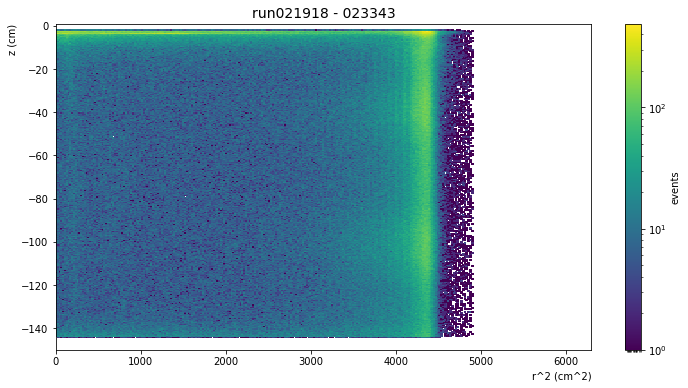

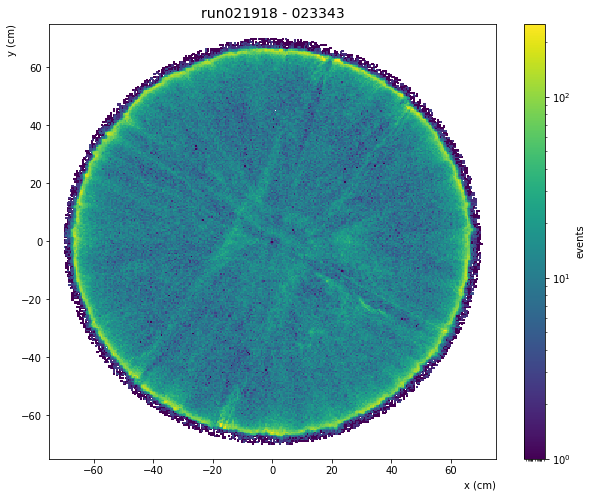

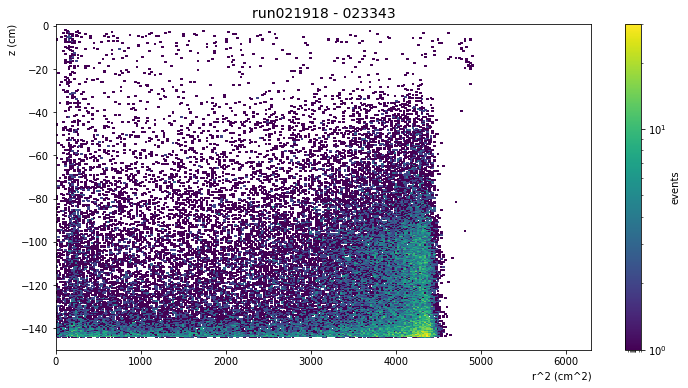

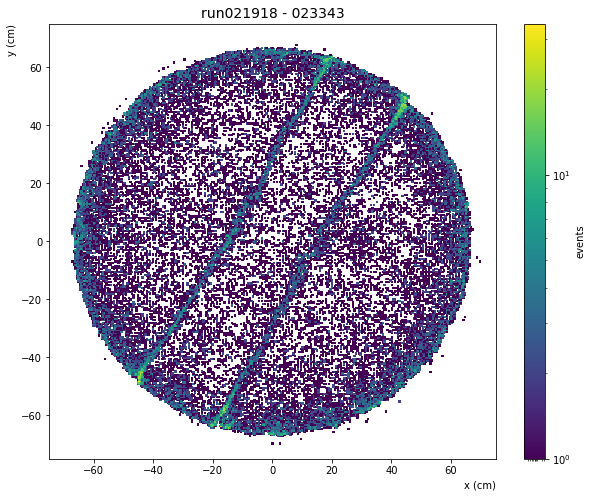

In [12]:
wcu.plot_r2_z(Rn220_events[wcu.basic_cuts(Rn220_events)],Rn220_runs)
wcu.plot_r2_z(Rn220_events[wcu.basic_cuts(Rn220_events)& (Rn220_events['s2_area']>5e4)
                 & (Rn220_events['s2_range_50p_area']>1e4)],Rn220_runs)

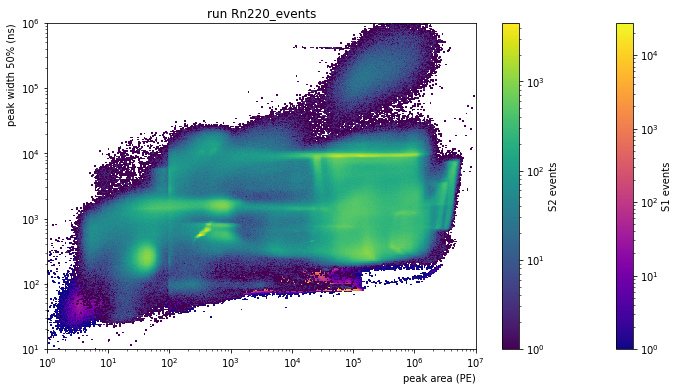

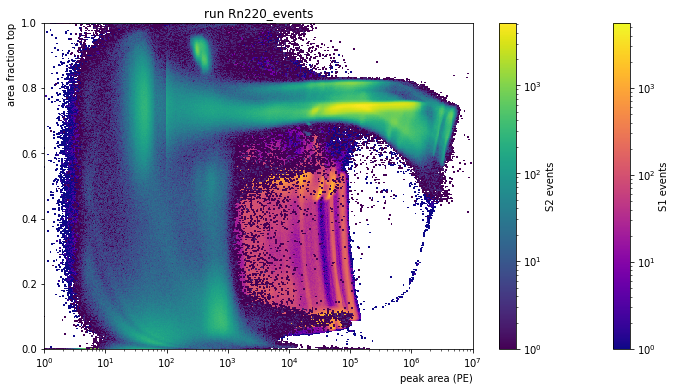

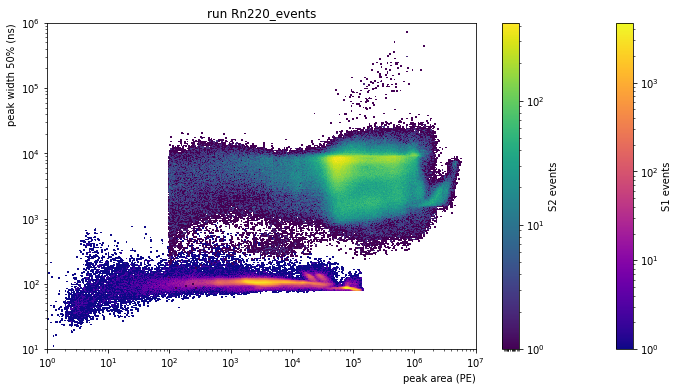

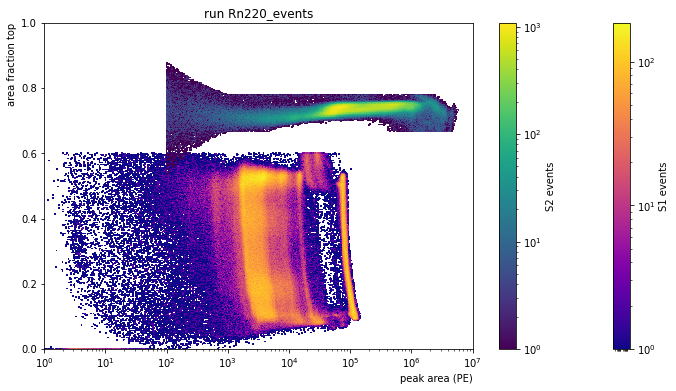

In [13]:
ddu.plot_area_width_aft(Rn220_events,'Rn220_events', low = 0, high = 7, low2 = 0, high2 = 1, binning = 500)
ddu.plot_area_width_aft(Rn220_events[wcu.basic_cuts(Rn220_events)],'Rn220_events', low = 0, high = 7, low2 = 0, high2 = 1, binning = 500)

/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])


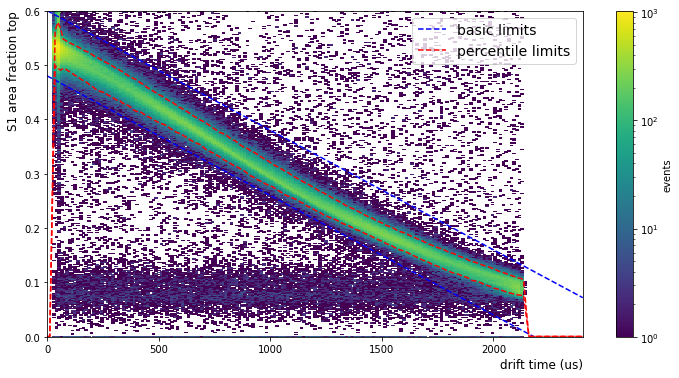

In [14]:
aft_cut = wcu.S1AFT_cut(Rn220_events, basic_cut = 1, plot = 1, prc = 5 )

/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])


total events 11694369 selected events 461151


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array

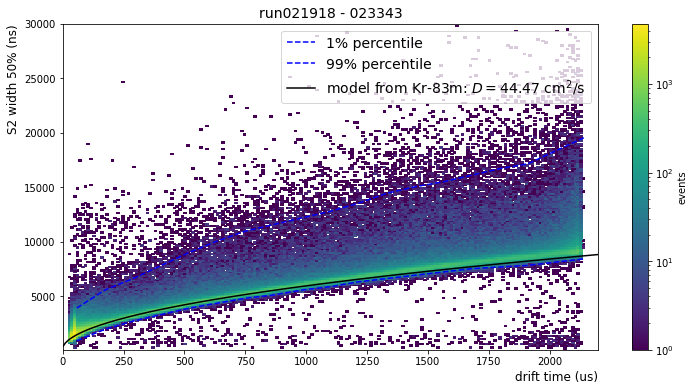

In [15]:
S2WidthCut_basic = wcu.S2WidthCut_basic(Rn220_events,Rn220_runs,mod_par=(44.47,0.676,375), perc=(1,99),
                                        FVcut = (-144,-2,3700), S1AFTcut = 5, plot=1)

/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])


total events 11694369 selected events 841945


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array

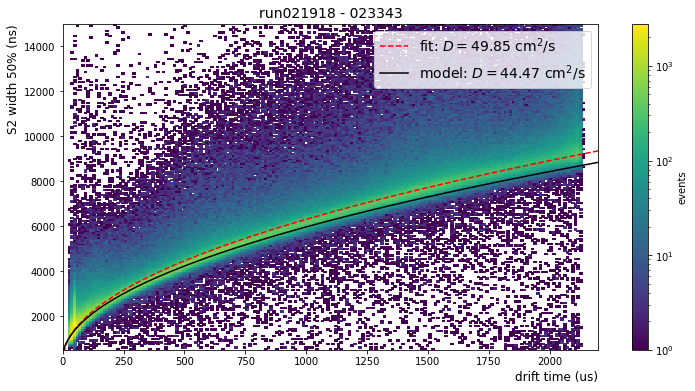

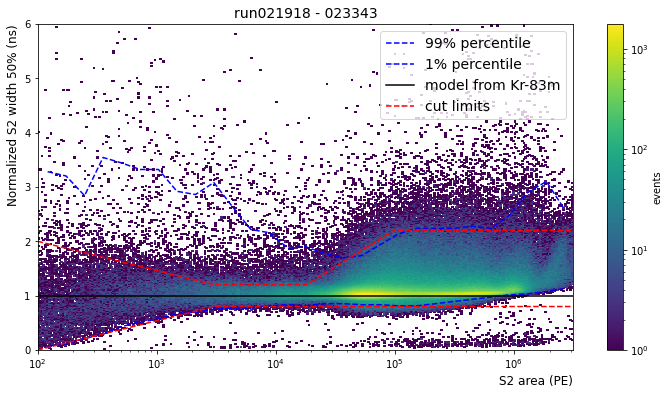

In [16]:
S2WidthCut = wcu.S2WidthCut_percentile(Rn220_events,Rn220_runs,mod_par=(44.47,0.676,375), perc=(1,99),
                                       FVcut=(-144,-2,5000), S1AFTcut = 5, delta=0.2,dlarge=1.2,plot=1)

In [17]:
ev1 = Rn220_events[wcu.basic_cuts(Rn220_events)]
ev2 = Rn220_events[wcu.basic_cuts(Rn220_events)&S2WidthCut_basic]
ev3 = Rn220_events[wcu.basic_cuts(Rn220_events)&S2WidthCut]
print('Total events',len(Rn220_events))
print('Events after basic cuts',len(ev1), len(ev1)/len(Rn220_events)*100)
print('Events after basic cuts & simple S2WidthCut',len(ev2), len(ev2)/len(ev1)*100)
print('Events after basic cuts & prel S2WidthCut',len(ev3), len(ev3)/len(ev1)*100)

Total events 11694369
Events after basic cuts 935899 8.00298844683283
Events after basic cuts & simple S2WidthCut 896908 95.83384531877905
Events after basic cuts & prel S2WidthCut 894567 95.58371149023559


In [18]:
wcu.display_events_S2WidthCut(st,Rn220_runs[4], nev = 10, s2_width_cut = True)

run 023098, start 2021-06-16 00:56:09.224984, livetime 1800.44 s, rate: 13.08 Hz, selection rate: 0.40 Hz
total events 23553 selected events 1905
events before width cut 119 events after selection 112 no width cut 7


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings

Loading BokehJS ...

/dali/lgrandi/strax/straxen/straxen/analyses/bokeh_waveform_plot.py:561: RuntimeWarning: divide by zero encountered in log10
  area_plot = np.log10(area_per_channel)


/dali/lgrandi/strax/straxen/straxen/analyses/bokeh_waveform_plot.py:561: RuntimeWarning: divide by zero encountered in log10
  area_plot = np.log10(area_per_channel)


In [19]:
wcu.display_events_S2WidthCut(st,Rn220_runs[4], nev = 10, s2_width_cut = False)

run 023098, start 2021-06-16 00:56:09.224984, livetime 1800.44 s, rate: 13.08 Hz, selection rate: 0.40 Hz
total events 23553 selected events 1905
events before width cut 119 events after selection 112 no width cut 7


/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:329: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  bin_edges = np.array(bin_edges)
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/multihist.py:449: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array([self.bin_centers(axis=i) for i in range(self.dimensions)])
/dali/lgrandi/strax/miniconda3/envs/strax/lib/python3.8/site-packages/scipy/optimize/minpack.py:828: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings

/dali/lgrandi/strax/straxen/straxen/analyses/bokeh_waveform_plot.py:561: RuntimeWarning: invalid value encountered in log10
  area_plot = np.log10(area_per_channel)
